In [1]:
import torch
from sklearn.model_selection import train_test_split
from load_data import sim_arr

# reshape from batch, height, width, channel, to batch, channel, height, width
sim_arr_transformed = sim_arr.reshape(
    sim_arr.shape[0], sim_arr.shape[3], sim_arr.shape[1], sim_arr.shape[2])

sim_arr_tensor = torch.tensor(sim_arr_transformed, dtype=torch.float32)

# train test split
train_data, test_data = train_test_split(
    sim_arr_tensor, test_size=0.2, random_state=42, shuffle=True)

In [2]:
from torch import nn

num_layers = 5
poolsize = [2, 2, 2, 2, 5]
channels = [3, 12, 7, 7, 11, 12]
kernel_sizes = [15, 10, 14, 14, 14]
dilations = [5, 5, 3, 3, 1]
activations = [nn.SiLU, nn.Tanh, nn.Softplus, nn.SiLU, nn.SiLU]
learning_rate = 0.0002568457560593339
batch_size = 32
epochs = 200

In [3]:
from vae import Encoder, Decoder, VarAutoEncoder
from cross_validation import train_model, evaluate_model

encoder = Encoder(num_layers, poolsize, channels, kernel_sizes, dilations, activations)
decoder = Decoder(encoder)
model = VarAutoEncoder(encoder, decoder)

train_model(model, train_data,
            lr=learning_rate, batch_size=batch_size, epochs=epochs)
evaluate_model(model, test_data, batch_size=batch_size)

Test Loss: 12786.8608


12786.860838221553

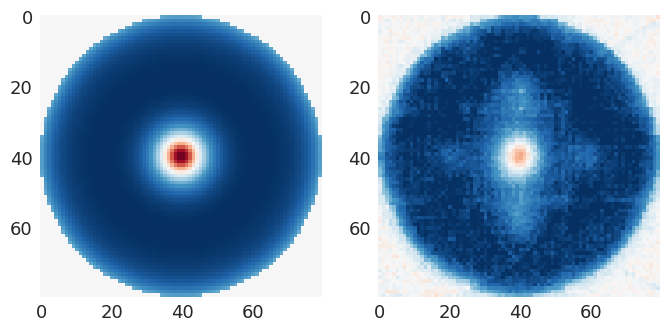

In [4]:
import numpy as np
import matplotlib.pyplot as plt

i = np.random.randint(0, len(test_data))
in_sim = test_data[i: i + 1]
in_sim = in_sim.to('cuda:0')
out_sim = model(in_sim)
in_sim = in_sim.detach().to('cpu').numpy()
in_sim = in_sim.reshape(
    in_sim.shape[0], in_sim.shape[2], in_sim.shape[3], in_sim.shape[1])
out_sim = out_sim[0].detach().to('cpu').numpy()
out_sim = out_sim.reshape(
    out_sim.shape[0], out_sim.shape[2], out_sim.shape[3], out_sim.shape[1])
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(in_sim[0, ..., 2], vmin=-1, vmax=1, cmap="RdBu")
ax[1].imshow(out_sim[0, ..., 2], vmin=-1, vmax=1, cmap="RdBu")

mu, _ = model.encoder(sim_arr_tensor.to('cuda'))
feature_array = mu.detach().to('cpu').numpy()
feature_array = (feature_array - feature_array.mean()) / feature_array.std()

In [14]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=16,
                      covariance_type='full',
                      random_state=42,
                      init_params='kmeans',
                      max_iter=1000)
gmm.fit(feature_array)
labels = gmm.predict(feature_array)

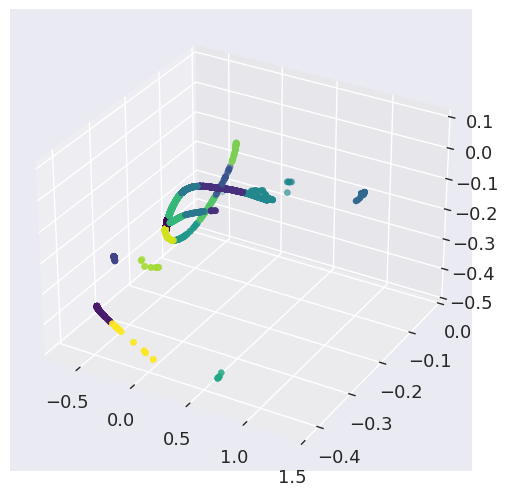

In [15]:
# plot the feature array in 3D with the labels as colors

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# feature_array = feature_array[0].detach().to('cpu').numpy()
ax.scatter(feature_array[:, 0], feature_array[:, 1],
           feature_array[:, 2], c=labels)

In [16]:
from cluster_acc import adj_rand_index, purity

print("Adjusted Rand Index: ", adj_rand_index(labels))
print("Purity: ", purity(labels))

Adjusted Rand Index:  0.0004991897734101076
Purity:  0.6166112956810631


In [17]:
import plotly.express as ptx
import plotly.graph_objs as go
from load_data import parameters_dict, simulation_file_paths
print(len(set(labels)) - (1 if -1 in labels else 0))


class_dict = {f"Class {i}": list() for i in range(len(set(labels)))}
class_dict["Outliers"] = list()
for index, path in enumerate(simulation_file_paths):
    class_ = labels[index]
    if class_ == -1:
        class_dict["Outliers"].append(str(path))
    else:
        class_dict[f"Class {class_}"].append(str(path))

traces = list()
for class_id, colour in zip(class_dict, ptx.colors.qualitative.Dark24):
    traces.append(
        go.Scatter(
            x=[
                parameters_dict[f]["H"]
                for f in class_dict[class_id]
            ],
            y=[
                parameters_dict[f]["E"]
                for f in class_dict[class_id]
            ],
            mode="markers",
            name=class_id,
            opacity=0.7,
            marker=dict(
                size=11,
                color=colour,
            ),
        )
    )

fig = go.Figure(data=traces)
fig.update_layout(
    autosize=False,
    width=990,
    height=600,
    margin=dict(
        l=10,
        r=10,
        b=25,
        t=25,
    ),
    xaxis_title=r"$\mu_0 \mathbf{H} \text{ (T)}$",
    yaxis_title=r"$\Delta \text{E (J)}$",
)

16


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': '#2E91E5', 'size': 11},
              'mode': 'markers',
              'name': 'Class 0',
              'opacity': 0.7,
              'type': 'scatter',
              'x': [1.0934684341269973, 1.0934684341269973, 1.0934684341269973,
                    ..., 1.1929253724128137, 1.1929253724128137,
                    0.7140948789521357],
              'y': [5.364196674100003e-18, 2.6203656911000007e-18, 0.0, ...,
                    5.805904993299995e-18, 2.8679891561000005e-18,
                    3.886484066799999e-18]},
             {'marker': {'color': '#E15F99', 'size': 11},
              'mode': 'markers',
              'name': 'Class 1',
              'opacity': 0.7,
              'type': 'scatter',
              'x': [0.1200051235924728, 0.1200051235924728, 0.1200051235924728,
                    0.12152269818476434, 0.12152269818476434, 0.12152269818476434,
                    0.09896463765738081, 0.09896463765738081, 0.09896463765738081,
                    0.13930175741253814, 0.13930175741253814, 0.13930175741253814,
                    0.12024626663464288, 0.12024626663464288, 0.12024626663464288,
                    0.05767995912901584, 0.05767995912901584, 0.07527286362065425,
                    0.07527286362065425, 0.07527286362065425, 0.05556525292833445,
                    0.05556525292833445, 0.104560520146578, 0.104560520146578,
                    0.104560520146578, 0.17335539617312118, 0.17335539617312118,
                    0.12282567902694742, 0.12282567902694742, 0.12282567902694742,
                    0.10404936148175352, 0.10404936148175352, 0.10404936148175352,
                    0.16160298068677026, 0.16160298068677026,
                    0.0049577451594033485, 0.0049577451594033485,
                    0.0049577451594033485, 0.16233320056405595,
                    0.16233320056405595, 0.08067118301082754, 0.08067118301082754,
                    0.08067118301082754, 0.18781819142144013, 0.18781819142144013,
                    0.09343237728599144, 0.09343237728599144, 0.09343237728599144,
                    0.012202489987678432, 0.012202489987678432,
                    0.012202489987678432, 0.1796772163756774, 0.1796772163756774,
                    0.12314500844208708, 0.12314500844208708, 0.12314500844208708,
                    0.06405041147039583, 0.06405041147039583, 0.06405041147039583,
                    0.020055601051892014, 0.020055601051892014,
                    0.020055601051892014, 0.029335013094577887,
                    0.029335013094577887, 0.029335013094577887,
                    0.01842989869844196, 0.01842989869844196, 0.01842989869844196,
                    0.1290774946406727, 0.1290774946406727, 0.1290774946406727,
                    0.1511396584396841, 0.1511396584396841, 0.10282549835843335,
                    0.10282549835843335, 0.10282549835843335, 0.048397381135607716,
                    0.048397381135607716, 0.048397381135607716,
                    0.15675005568735337, 0.15675005568735337, 0.10628000491945659,
                    0.10628000491945659, 0.10628000491945659, 0.1847971783887045,
                    0.1847971783887045, 0.15679231120900416, 0.15679231120900416,
                    0.13120496795805647, 0.13120496795805647, 0.13120496795805647,
                    0.09520598533519938, 0.09520598533519938, 0.09520598533519938,
                    0.0680853551098887, 0.0680853551098887, 0.0680853551098887,
                    0.1467594265549136, 0.1467594265549136, 0.013790040024915795,
                    0.013790040024915795, 0.013790040024915795,
                    0.0045748663348678335, 0.0045748663348678335,
                    0.0045748663348678335, 0.10862032555585044,
                    0.10862032555585044, 0.10862032555585044, 0.06415061172236722,
                    0.06415061172236722, 0.06415061172236722],
              'y': [3.939432427099998e-18, 3.939432427099998e-18,
                    

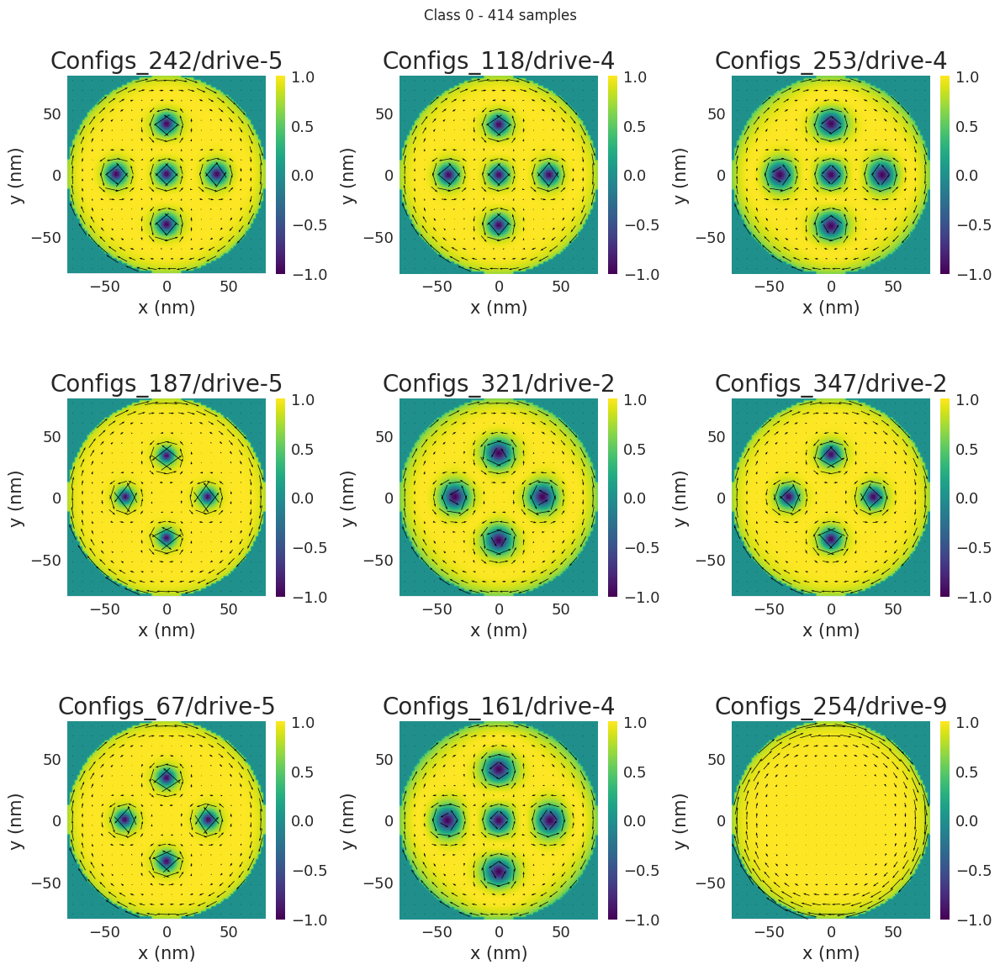

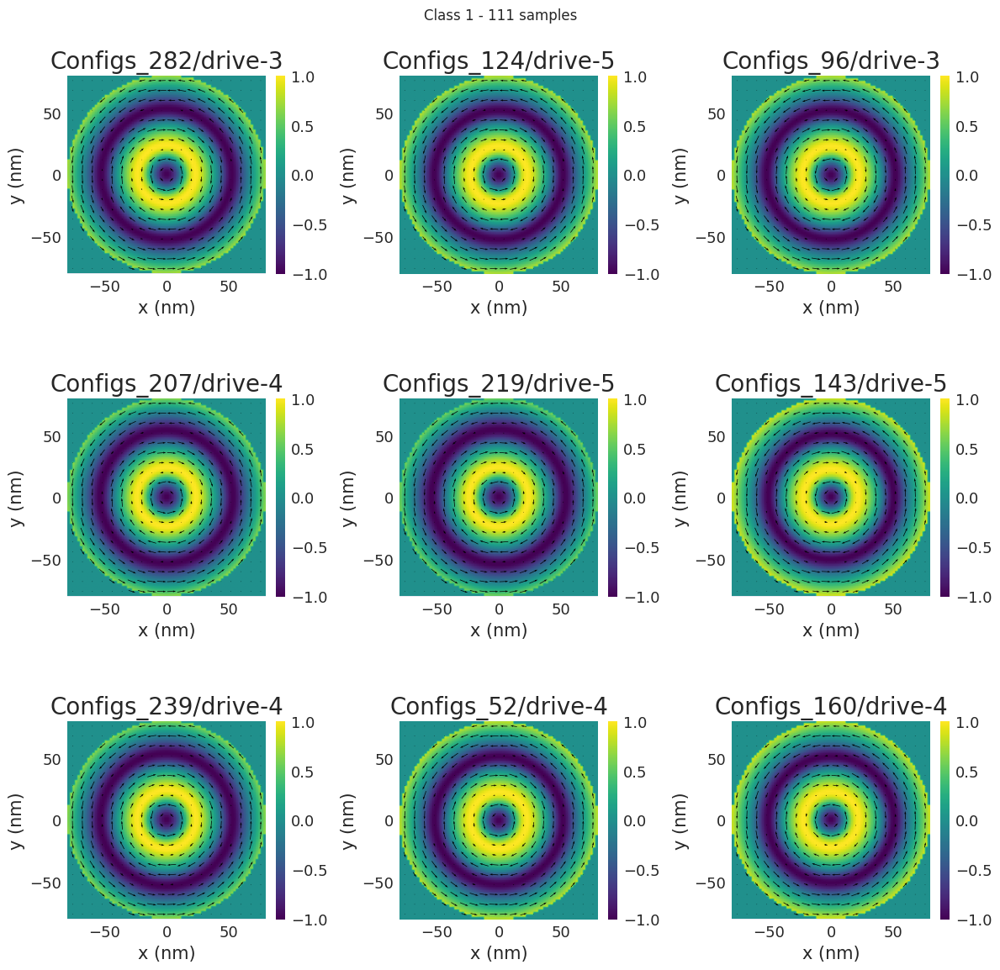

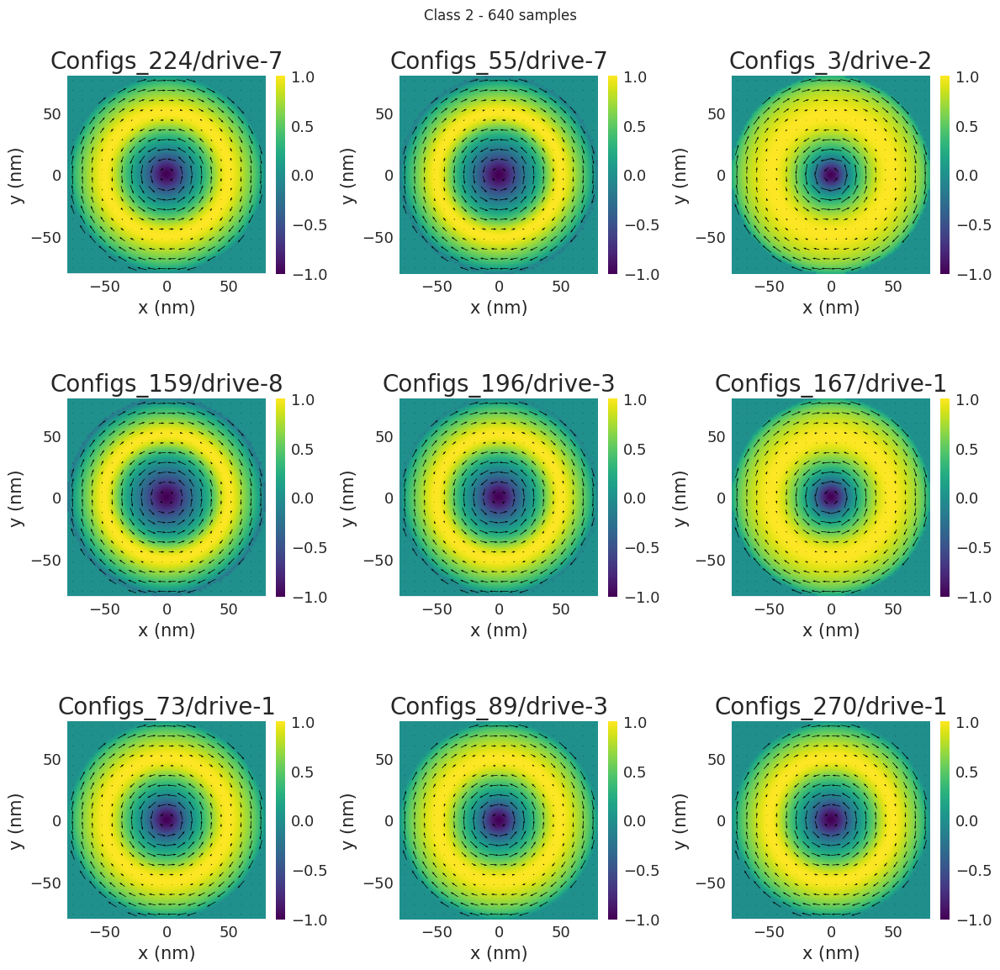

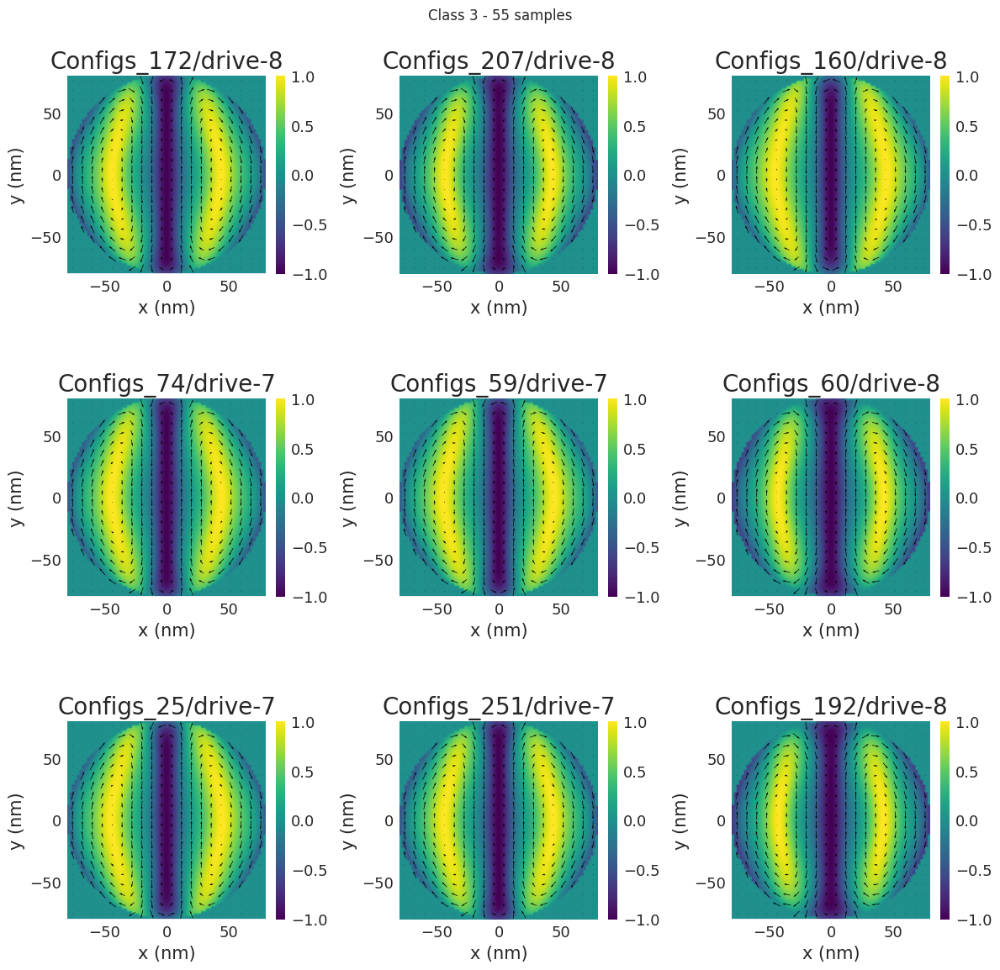

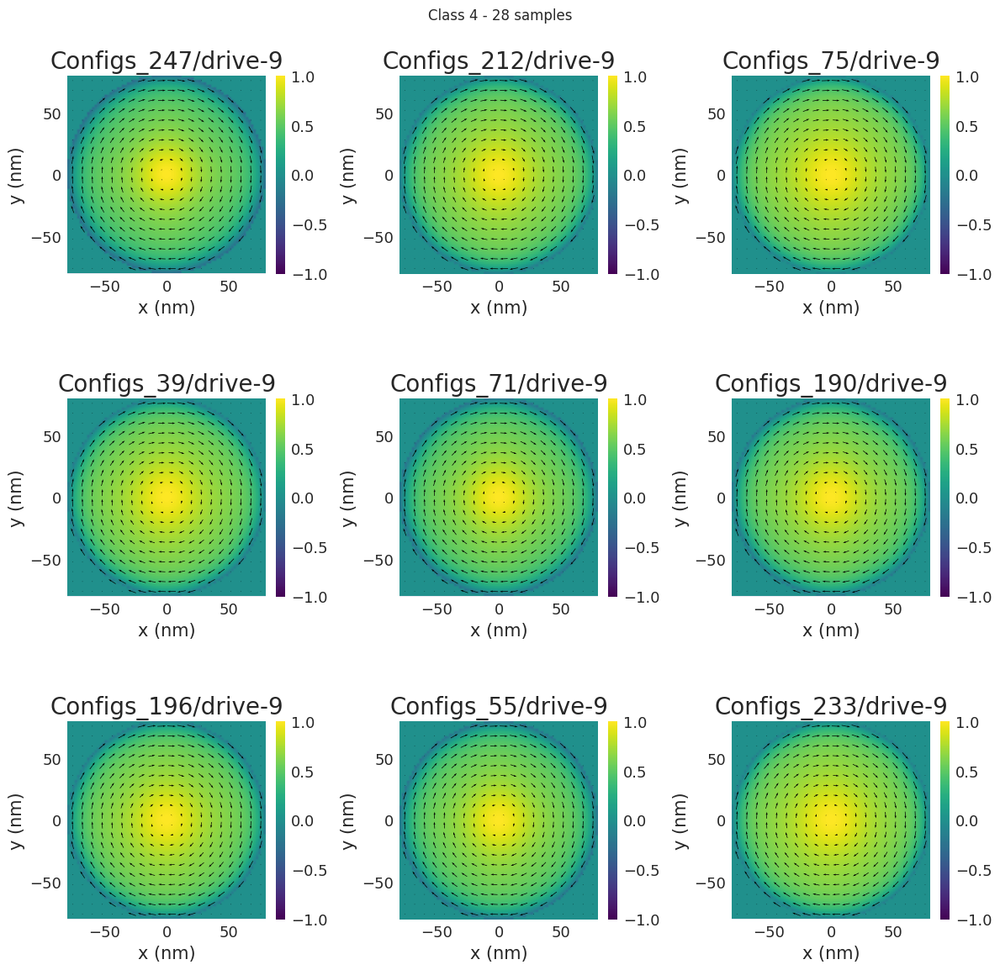

...

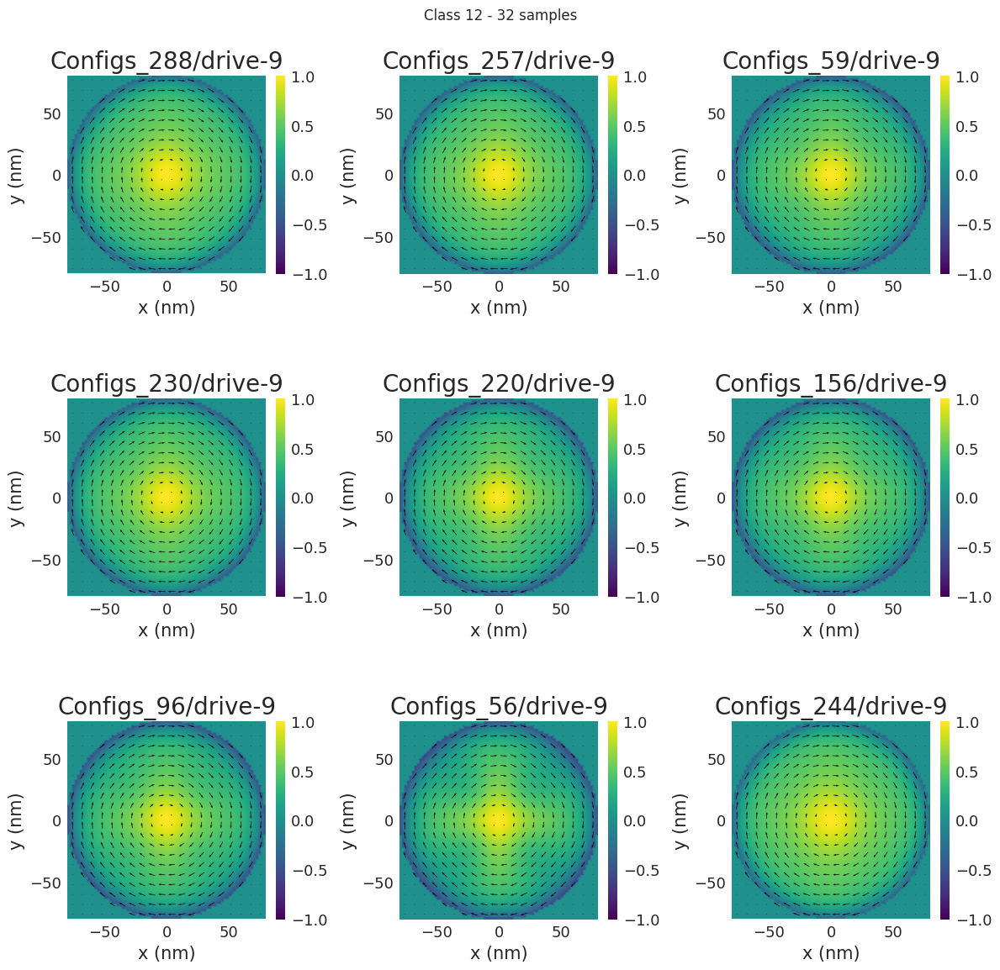

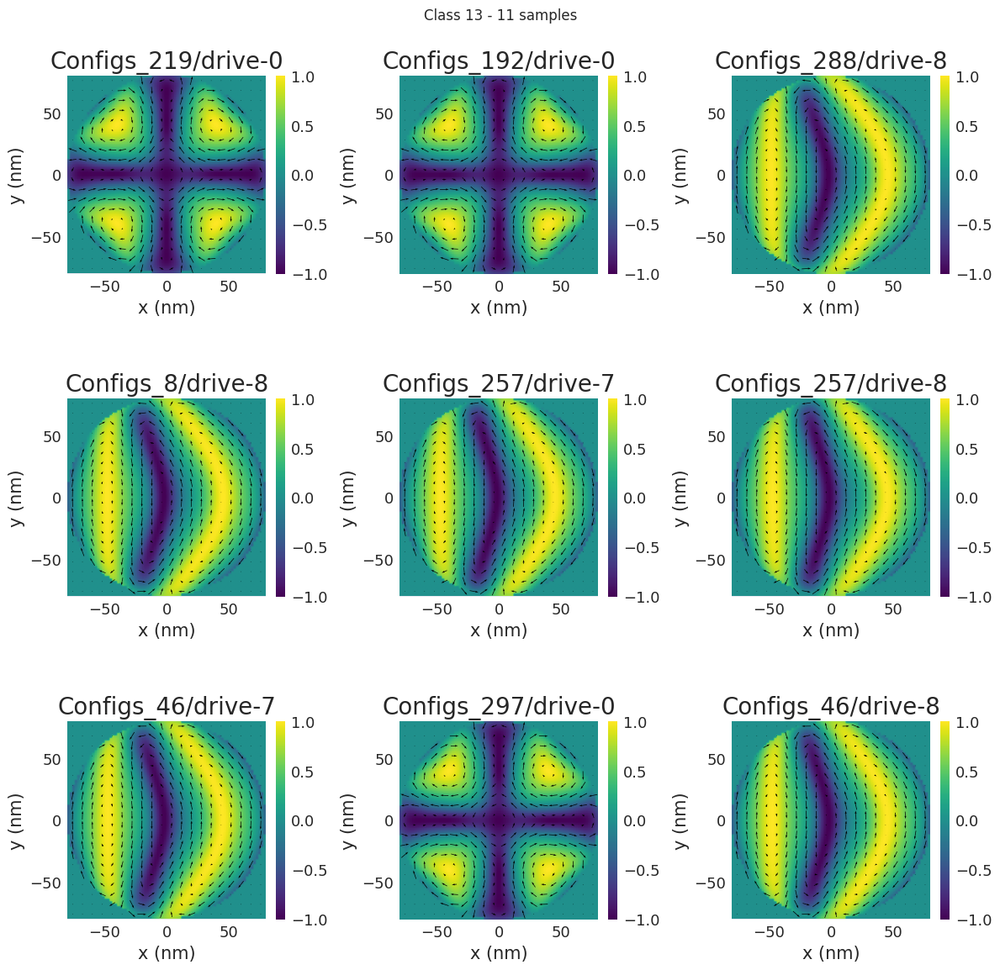

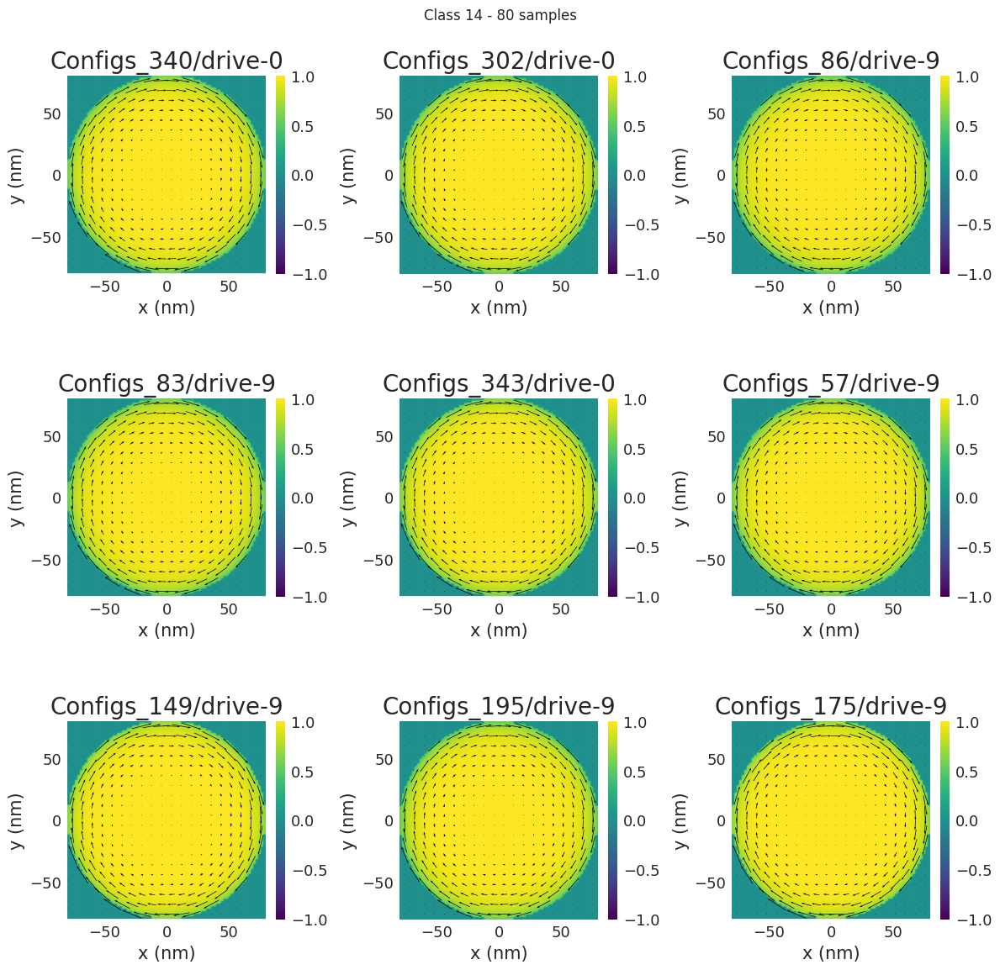

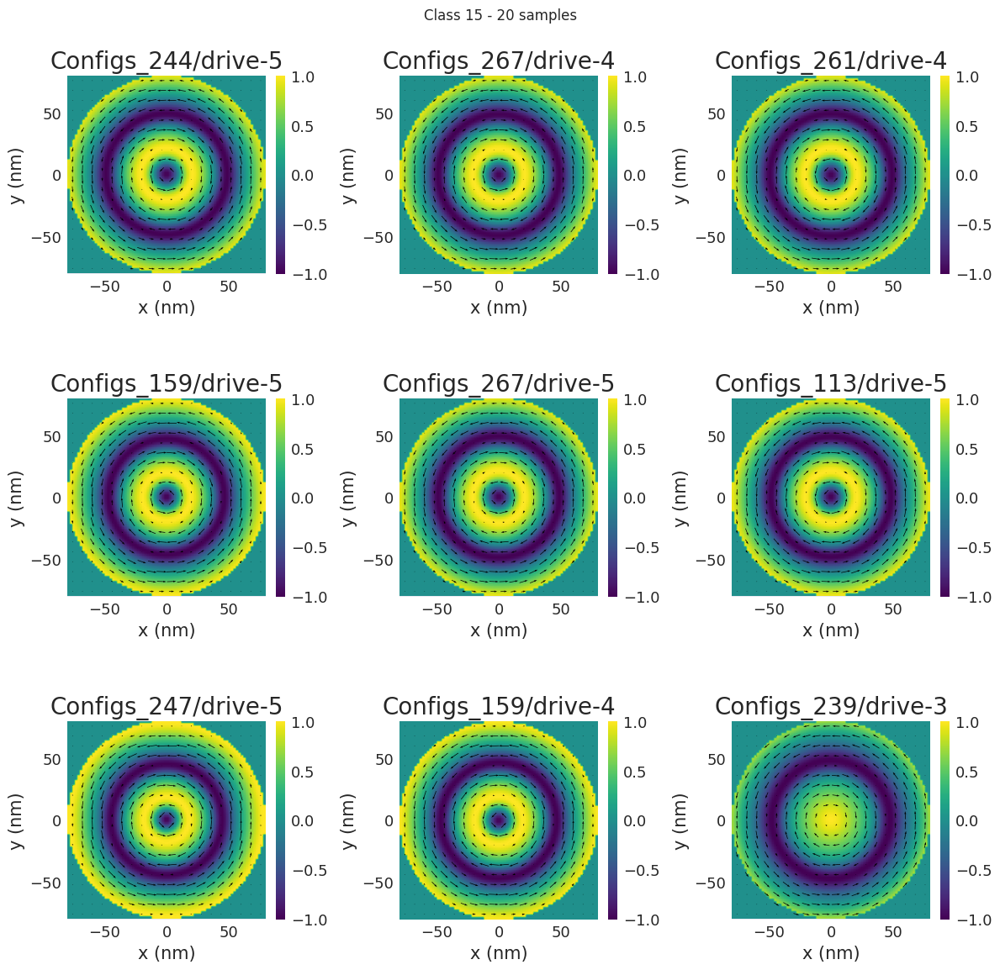

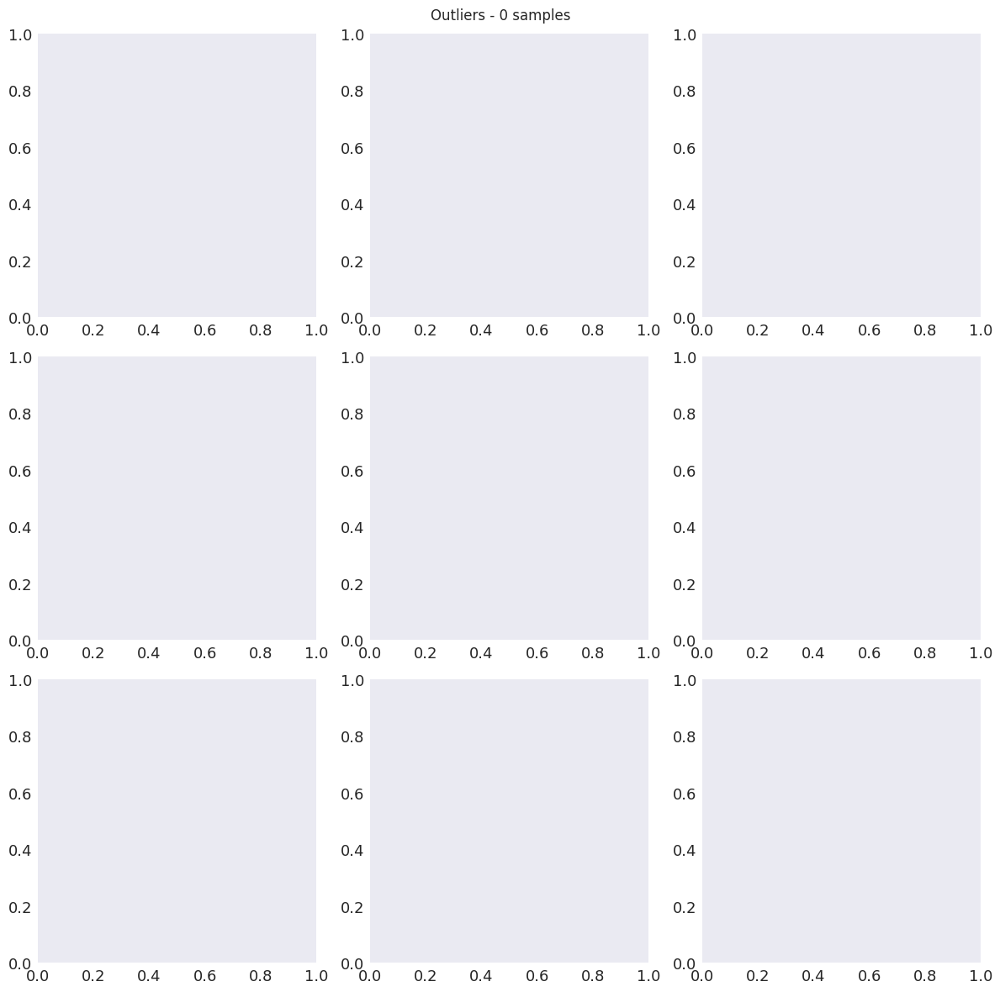

In [18]:
from plotting import plot_all_examples

plot_all_examples(class_dict, parameters_dict)